# Basic Setup

In [10]:
# check if GPU has been used
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat Jul 25 14:57:09 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P0    36W / 250W |    353MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [11]:
# check if High-RAM has been used
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.4 gigabytes of available RAM

You are using a high-RAM runtime!


In [12]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [13]:
import os
import numpy as np
import pandas as pd
from glob import glob
from itertools import chain
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, average_precision_score
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import tensorflow as tf

In [14]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [15]:
# DATA_DIR = '/content/drive/My Drive/Datasets/NIH_chest_xray/NIH_chest_xray_image'
from google.colab import drive
# drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)
DATA_DIR = "/content/gdrive/My Drive/w210_capstone/balance_set_age_local/"
image_size = 224
batch_size = 32

Mounted at /content/gdrive


In [16]:
df = pd.read_csv("/content/gdrive/My Drive/w210_capstone/Balance_set_age/balance_age.csv", sep='\t')
df.head()
data_image_paths = {os.path.basename(x): x for x in glob(os.path.join(DATA_DIR, '*', '*.png'))}
df['path'] = df.idx.map(data_image_paths.get)
df.disease = df.disease.map(lambda x: x.replace('No Finding', 'Normal'))
df = df.dropna(axis=0)
labels = np.unique(df.disease.tolist())
labels = [x for x in labels if len(x) > 0]




In [17]:
labels

['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Effusion',
 'Infiltration',
 'Mass',
 'Nodule',
 'Normal',
 'Pleural_Thickening']

### subset for only loading Normal

In [ ]:
df_normal = df[[i in ['Normal'] for i in df.disease]]
labels = np.unique(df_normal.disease.tolist())
labels = [x for x in labels if len(x) > 0]


In [ ]:
labels

['Normal']

### subset for only loading Cardiomegaly

In [10]:
df_normal = df[[i in ['Cardiomegaly'] for i in df.disease]]
labels = np.unique(df_normal.disease.tolist())
labels = [x for x in labels if len(x) > 0]


In [11]:
labels

['Cardiomegaly']

### subset for only loading Effusion

In [9]:
df_normal = df[[i in ['Effusion'] for i in df.disease]]
labels = np.unique(df_normal.disease.tolist())
labels = [x for x in labels if len(x) > 0]


In [10]:
labels

['Effusion']

In [11]:
df_normal.shape

(2000, 8)

### change df_normal columns

In [ ]:
df_normal = df_normal[['idx', 'disease', 'followup', 'gender', 'position', 'age',
       'path']]
df_normal.head()

,idx,disease,followup,gender,position,age,path
28,00000041_006.png,Effusion,6,F,PA,62,/content/gdrive/My Drive/w210_capstone/balance...
40,00000084_000.png,Effusion,0,F,PA,57,/content/gdrive/My Drive/w210_capstone/balance...
44,00000099_002.png,Effusion,2,F,PA,56,/content/gdrive/My Drive/w210_capstone/balance...
45,00000099_008.png,Effusion,8,F,AP,58,/content/gdrive/My Drive/w210_capstone/balance...
46,00000099_012.png,Effusion,12,F,PA,58,/content/gdrive/My Drive/w210_capstone/balance...


In [ ]:
df_normal.shape

(2000, 7)

### add COVID

In [18]:
df_covid = pd.read_csv('/content/gdrive/My Drive/w210_capstone/covid-chestxray-dataset-master.zip (Unzipped Files)/covid-chestxray-dataset-master/metadata.csv')
# df_covid.head()
df_covid = df_covid[df_covid.modality == 'X-ray']
df_covid = df_covid[df_covid.finding == 'COVID-19']
df_covid = df_covid[(df_covid.view == 'PA') | (df_covid.view == "AP")]
df_covid_small = df_covid[['filename', 'finding','sex','view','age']]


In [19]:
list_covid_name = list(df_covid_small.filename)
list_covid_path = [DATA_DIR+"Covid/"+i for i in list_covid_name]
len(list_covid_path)

295

In [20]:

df_covid_small['path'] = list_covid_path
df_covid_small['followup'] = 0
df_covid_small.columns

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Index(['filename', 'finding', 'sex', 'view', 'age', 'path', 'followup'], dtype='object')

In [21]:
df_covid_small = df_covid_small[['filename','finding','followup','sex','view','age','path']]
df_covid_small.head()

,filename,finding,followup,sex,view,age,path
0,auntminnie-a-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
1,auntminnie-b-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
2,auntminnie-c-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
3,auntminnie-d-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
4,nejmc2001573_f1a.jpeg,COVID-19,0,F,PA,52.0,/content/gdrive/My Drive/w210_capstone/balance...


In [22]:
df_covid_small.columns = ['idx', 'disease', 'followup', 'gender', 'position', 'age',
       'path']
df_covid_small.head()

,idx,disease,followup,gender,position,age,path
0,auntminnie-a-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
1,auntminnie-b-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
2,auntminnie-c-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
3,auntminnie-d-2020_01_28_23_51_6665_2020_01_28_...,COVID-19,0,M,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...
4,nejmc2001573_f1a.jpeg,COVID-19,0,F,PA,52.0,/content/gdrive/My Drive/w210_capstone/balance...


In [ ]:
# df_covid_small.to_csv('/content/gdrive/My Drive/w210_capstone/balance_set_age_local/covid_list.csv')

In [ ]:
# !ls '/content/gdrive/My Drive/w210_capstone/balance_set_age_local/Covid/auntminnie-a-2020_01_28_23_51_6665_2020_01_28_Vietnam_coronavirus.jpeg'

'/content/gdrive/My Drive/w210_capstone/balance_set_age_local/Covid/auntminnie-a-2020_01_28_23_51_6665_2020_01_28_Vietnam_coronavirus.jpeg'


### combine COVID into full category

In [23]:
df = df[['idx', 'disease', 'followup', 'gender', 'position', 'age',
       'path']]
df.head()

,idx,disease,followup,gender,position,age,path
0,00000001_000.png,Cardiomegaly,0,M,PA,58,/content/gdrive/My Drive/w210_capstone/balance...
1,00000005_006.png,Infiltration,6,F,PA,70,/content/gdrive/My Drive/w210_capstone/balance...
2,00000008_000.png,Cardiomegaly,0,F,PA,69,/content/gdrive/My Drive/w210_capstone/balance...
3,00000013_003.png,Pleural_Thickening,3,M,AP,60,/content/gdrive/My Drive/w210_capstone/balance...
4,00000013_009.png,Pleural_Thickening,9,M,AP,60,/content/gdrive/My Drive/w210_capstone/balance...


In [24]:
df.shape

(14958, 7)

In [25]:
df.disease.value_counts()

Normal                2000
Infiltration          2000
Atelectasis           2000
Nodule                2000
Effusion              2000
Mass                  1926
Consolidation         1106
Pleural_Thickening     985
Cardiomegaly           941
Name: disease, dtype: int64

In [26]:
df_small = df.sample(frac=0.05, random_state=105).reset_index(drop=True)
df_small.disease.value_counts()

Nodule                111
Infiltration          106
Atelectasis           106
Mass                   98
Normal                 95
Effusion               90
Consolidation          58
Pleural_Thickening     46
Cardiomegaly           38
Name: disease, dtype: int64

In [27]:
''' change the disease names all to none-covid'''
df_small.disease = 'non-COVID'
df_small.disease.value_counts()

non-COVID    748
Name: disease, dtype: int64

In [33]:
df_comb = df_small.append(df_covid_small)
df_comb.shape

(1043, 7)

In [34]:
df_comb.head()

,idx,disease,followup,gender,position,age,path
0,00001202_001.png,non-COVID,1,F,PA,46.0,/content/gdrive/My Drive/w210_capstone/balance...
1,00006818_005.png,non-COVID,5,F,PA,46.0,/content/gdrive/My Drive/w210_capstone/balance...
2,00011438_001.png,non-COVID,1,M,PA,25.0,/content/gdrive/My Drive/w210_capstone/balance...
3,00010773_002.png,non-COVID,2,F,AP,54.0,/content/gdrive/My Drive/w210_capstone/balance...
4,00007018_018.png,non-COVID,18,M,AP,28.0,/content/gdrive/My Drive/w210_capstone/balance...


In [35]:
df_comb.disease.value_counts()

non-COVID    748
COVID-19     295
Name: disease, dtype: int64

In [37]:
labels = np.unique(df_comb.disease.tolist())
labels = [x for x in labels if len(x) > 0]
labels

['COVID-19', 'non-COVID']

In [38]:
for label in labels:
    if len(label) > 1:
        df_comb[label] = df_comb.disease.map(lambda finding: 1.0 if label in finding else 0.0)

In [39]:
df_comb.head()

,idx,disease,followup,gender,position,age,path,COVID-19,non-COVID
0,00001202_001.png,non-COVID,1,F,PA,46.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
1,00006818_005.png,non-COVID,5,F,PA,46.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
2,00011438_001.png,non-COVID,1,M,PA,25.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
3,00010773_002.png,non-COVID,2,F,AP,54.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
4,00007018_018.png,non-COVID,18,M,AP,28.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0


In [40]:
df_comb = df_comb.sample(frac=1, random_state=105).reset_index(drop=True)

In [41]:
df_comb.head()

,idx,disease,followup,gender,position,age,path,COVID-19,non-COVID
0,00000138_004.png,non-COVID,4,F,PA,65.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
1,covid-19-pneumonia-8.jpg,COVID-19,0,M,PA,45.0,/content/gdrive/My Drive/w210_capstone/balance...,1.0,0.0
2,00005051_002.png,non-COVID,2,F,AP,60.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
3,00025825_004.png,non-COVID,4,F,AP,38.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0
4,00015732_045.png,non-COVID,45,F,AP,48.0,/content/gdrive/My Drive/w210_capstone/balance...,0.0,1.0


### combine COVID into disease category

In [19]:
df_normal = df_normal.sample(frac=0.15, random_state=105).reset_index(drop=True)

In [20]:
df_comb = df_normal.append(df_covid_small)
df_comb.shape

(595, 7)

In [21]:
df_comb = df_comb.dropna(axis=0)

In [22]:
labels = np.unique(df_comb.disease.tolist())
labels = [x for x in labels if len(x) > 0]

In [23]:
labels

['COVID-19', 'Effusion']

In [23]:
for label in labels:
    if len(label) > 1:
        df_comb[label] = df_comb.disease.map(lambda finding: 1.0 if label in finding else 0.0)

In [24]:
df_comb = df_comb.sample(frac=1, random_state=105).reset_index(drop=True)

### combine COVID into Cardiomegaly category

In [19]:
df_normal = df_normal.sample(frac=0.3, random_state=105).reset_index(drop=True)

In [20]:
df_comb = df_normal.append(df_covid_small)
df_comb.shape

(577, 7)

In [21]:
df_comb = df_comb.dropna(axis=0)

In [22]:
labels = np.unique(df_comb.disease.tolist())
labels = [x for x in labels if len(x) > 0]

In [23]:
labels

['COVID-19', 'Cardiomegaly']

In [24]:
for label in labels:
    if len(label) > 1:
        df_comb[label] = df_comb.disease.map(lambda finding: 1.0 if label in finding else 0.0)

In [25]:
df_comb = df_comb.sample(frac=1, random_state=105).reset_index(drop=True)

### combine COVID into Effusion category

In [56]:
df_normal = df_normal.sample(frac=0.15, random_state=105).reset_index(drop=True)

In [57]:
df_normal.shape

(300, 8)

In [58]:
df_comb = df_normal.append(df_covid_small)
df_comb.shape

(595, 8)

In [59]:
df_comb = df_comb.dropna(axis=0)

In [62]:
df_comb.shape

(300, 8)

In [60]:
labels = np.unique(df_comb.disease.tolist())
labels = [x for x in labels if len(x) > 0]

In [61]:
labels

['Effusion']

In [50]:
for label in labels:
    if len(label) > 1:
        df_comb[label] = df_comb.disease.map(lambda finding: 1.0 if label in finding else 0.0)

In [51]:
df_comb = df_comb.sample(frac=1, random_state=105).reset_index(drop=True)

# prepare train test data and train the model

In [42]:
df_comb_small = df_comb[['disease', 'path']]
df_comb_small.head(50)

,disease,path
0,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...
1,COVID-19,/content/gdrive/My Drive/w210_capstone/balance...
2,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...
3,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...
4,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...
5,COVID-19,/content/gdrive/My Drive/w210_capstone/balance...
6,COVID-19,/content/gdrive/My Drive/w210_capstone/balance...
7,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...
8,COVID-19,/content/gdrive/My Drive/w210_capstone/balance...
9,non-COVID,/content/gdrive/My Drive/w210_capstone/balance...


In [43]:
train_df, valid_df = train_test_split(df_comb_small, test_size=0.20, random_state=2018)

In [44]:
train_df['labels'] = train_df.apply(lambda x: x['disease'], axis=1)
valid_df['labels'] = valid_df.apply(lambda x: x['disease'], axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [45]:
train_df.disease.value_counts()

non-COVID    597
COVID-19     237
Name: disease, dtype: int64

In [46]:
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix
class_weight_list = class_weight.compute_class_weight('balanced', np.unique(train_df.disease.tolist()), train_df.disease.tolist())
class_weight_dict = {i: class_weight_list[i] for i in range(0, len(class_weight_list))}
class_weight_dict

{0: 1.759493670886076, 1: 0.6984924623115578}

In [47]:
valid_df.disease.value_counts()

non-COVID    151
COVID-19      58
Name: disease, dtype: int64

(array([30., 27., 21., 18., 22., 17., 29., 17., 28., 28.]),
 array([1.000e+00, 1.049e+02, 2.088e+02, 3.127e+02, 4.166e+02, 5.205e+02,
        6.244e+02, 7.283e+02, 8.322e+02, 9.361e+02, 1.040e+03]),
 <a list of 10 Patch objects>)

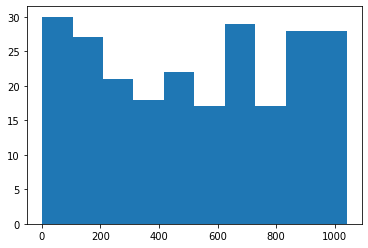

In [48]:
list_indices = train_df.index[train_df.disease == 'COVID-19'].to_list()
plt.hist(list_indices)

(array([6., 4., 7., 3., 6., 5., 3., 9., 6., 9.]),
 array([  36. ,  136.1,  236.2,  336.3,  436.4,  536.5,  636.6,  736.7,
         836.8,  936.9, 1037. ]),
 <a list of 10 Patch objects>)

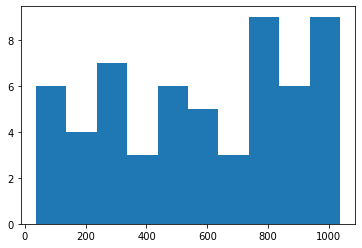

In [49]:
list_indices = valid_df.index[valid_df.disease == 'COVID-19'].to_list()
plt.hist(list_indices)

In [50]:
%%time
core_idg = ImageDataGenerator(rescale=1 / 255,
                                  # samplewise_center=True,
                                  # samplewise_std_normalization=True,
                                  horizontal_flip=True,
                                  vertical_flip=False,
                                  height_shift_range=0.05,
                                  width_shift_range=0.1,
                                  rotation_range=2.5,
                                  shear_range=0.1,
                                  fill_mode='reflect',
                                  zoom_range=0.15)

train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                             directory=None,
                                             x_col='path',
                                             y_col='labels',
                                             class_mode='categorical',
                                             batch_size=batch_size,
                                             classes=labels,
                                             target_size=(image_size, image_size))

# valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
#                                              directory=None,
#                                              x_col='path',
#                                              y_col='labels',
#                                              class_mode='categorical',
#                                              batch_size=batch_size,
#                                              classes=labels,
#                                              target_size=(image_size, image_size))

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=valid_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))

Found 834 validated image filenames belonging to 2 classes.
Found 209 validated image filenames belonging to 2 classes.
CPU times: user 6.47 s, sys: 357 ms, total: 6.82 s
Wall time: 1min 10s


In [51]:
tf.keras.backend.clear_session()

In [52]:
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Dense, Flatten, Activation, Dropout, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, History, ModelCheckpoint
from tensorflow.keras import optimizers
from tensorflow.keras import Model, Input
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow import keras
from tensorflow.keras import layers


# Load the TensorBoard notebook extension.
%load_ext tensorboard

from datetime import datetime
from packaging import version

import tensorflow as tf
import numpy as np

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."

TensorFlow version:  2.2.0


In [53]:
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

class MetricsCheckpoint(Callback):

  def __init__(self, savepath):
    super(MetricsCheckpoint, self).__init__()
    self.savepath = savepath
    self.history = {}
      
  def on_epoch_end(self, epoch, logs=None):
    for k, v in logs.items():
        self.history.setdefault(k, []).append(v)
    np.save(self.savepath, self.history)


def plotkerasLearningCurve():
  plt.figure(figsize=(10, 5))
  metrics = np.load('logs.npy', allow_pickle=True)[()]
  filt = ['acc'] # see 'loss'
  for k in filter(lambda x: np.any([kk in x for kk in filt]), metrics.keys()):
    l = np.array(metrics[k])
    plt.plot(l, c='r' if 'val' not in k else 'b', label = 'val' if 'val' in k else 'train')
    x = np.argmin(l) if 'loss' in k else np.argmax(l)
    y = l[x]
    plt.scatter(x, y, lw=0, alpha=0.25, s=100, c='r' if 'val' not in k else 'b')
    plt.text(x, y, '{} = {:.4f}'.format(x,y), size='15', color='r' if 'val' not in k else 'b')
    plt.legend(loc=4)
    plt.axis([0, None, None, None])
    plt.grid()
    plt.xlabel('Number of epochs')
    plt.ylabel('Accuracy')

import itertools

def plotConfusionMatrix(cm, classes, normalize = False, title = 'Confusion Matrix', cmap = plt.cm.Blues):
  plt.figure(figsize=(8, 8))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title = title
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=90)
  plt.yticks(tick_marks, classes)
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print("Confusion matrix, without nomralization")
  
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i, j] > thresh else 'black')
  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')


def plotLearningCurve(history):
  plt.figure(figsize=(8, 8))

  plt.subplot(1, 2, 1)
  plt.plot(history.history['binary_accuracy'])
  plt.plot(history.history['val_binary_accuracy'])
  # plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.savefig('./accuracy_curve.png')

  plt.subplot(1, 2, 2)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  # plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.savefig('./loss_curve.png')

#### train COVID-nonCOVID - 11 layers

29089792/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_____________________________

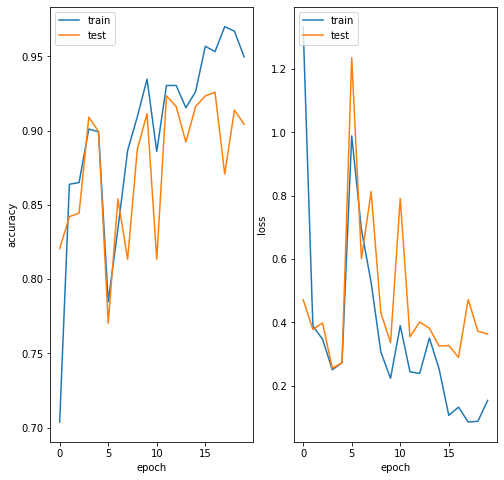

Epoch 1/50
27/27 [==============================] - ETA: 0s - loss: 0.2854 - binary_accuracy: 0.9203 - auc: 0.9642
Epoch 00001: loss improved from inf to 0.28540, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_nonCOVID/model_21_nonCOVID.h5
27/27 [==============================] - 30s 1s/step - loss: 0.2854 - binary_accuracy: 0.9203 - auc: 0.9642 - val_loss: 0.5145 - val_binary_accuracy: 0.8995 - val_auc: 0.9480
Epoch 2/50
26/27 [===========================>..] - ETA: 0s - loss: 0.1722 - binary_accuracy: 0.9603 - auc: 0.9862
Epoch 00002: loss improved from 0.28540 to 0.17180, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_nonCOVID/model_21_nonCOVID.h5
27/27 [==============================] - 28s 1s/step - loss: 0.1718 - binary_accuracy: 0.9604 - auc: 0.9862 - val_loss: 0.3119 - val_binary_accuracy: 0.9187 - val_auc: 0.9730
Epoch 3/50
27/27 [==============================] - ETA: 0s - loss: 0.1323 - binary_accuracy

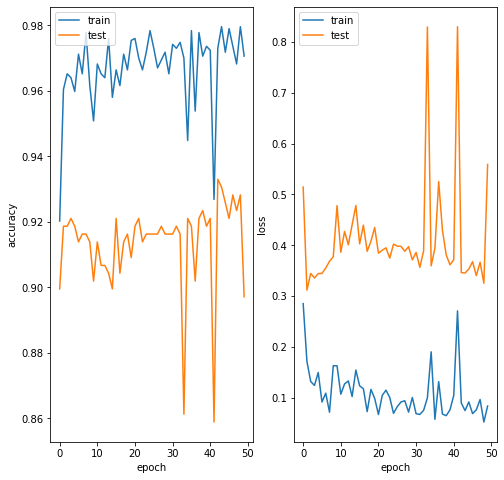

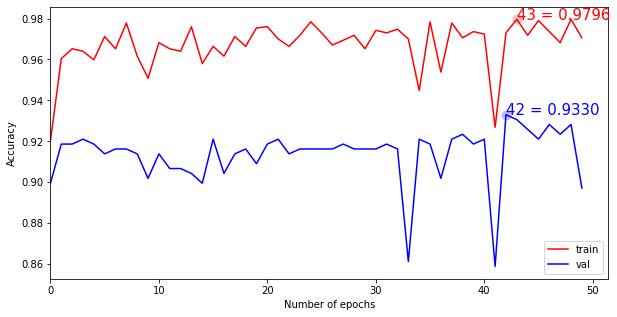

In [54]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_nonCOVID/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_nonCOVID/model_21_nonCOVID.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-11]:
    layer.trainable=False
    
for layer in model.layers[-11:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_nonCOVID/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_nonCOVID/model_21_nonCOVID.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [55]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_nonCOVID/model_21_nonCOVID.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

COVID-19: actual: 27.75%, predicted: 27.85%
non-COVID: actual: 72.25%, predicted: 71.96%


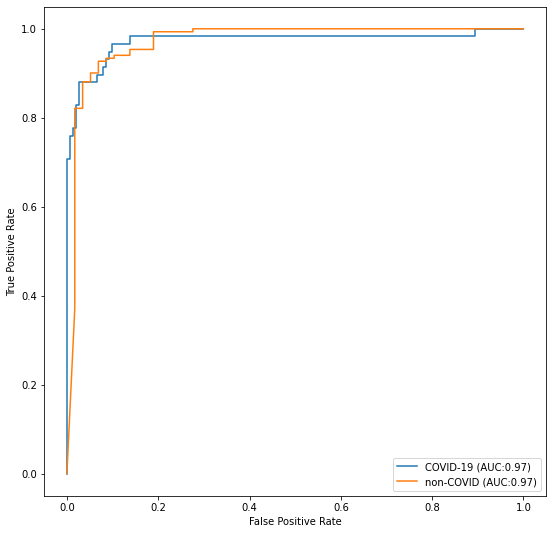

In [56]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

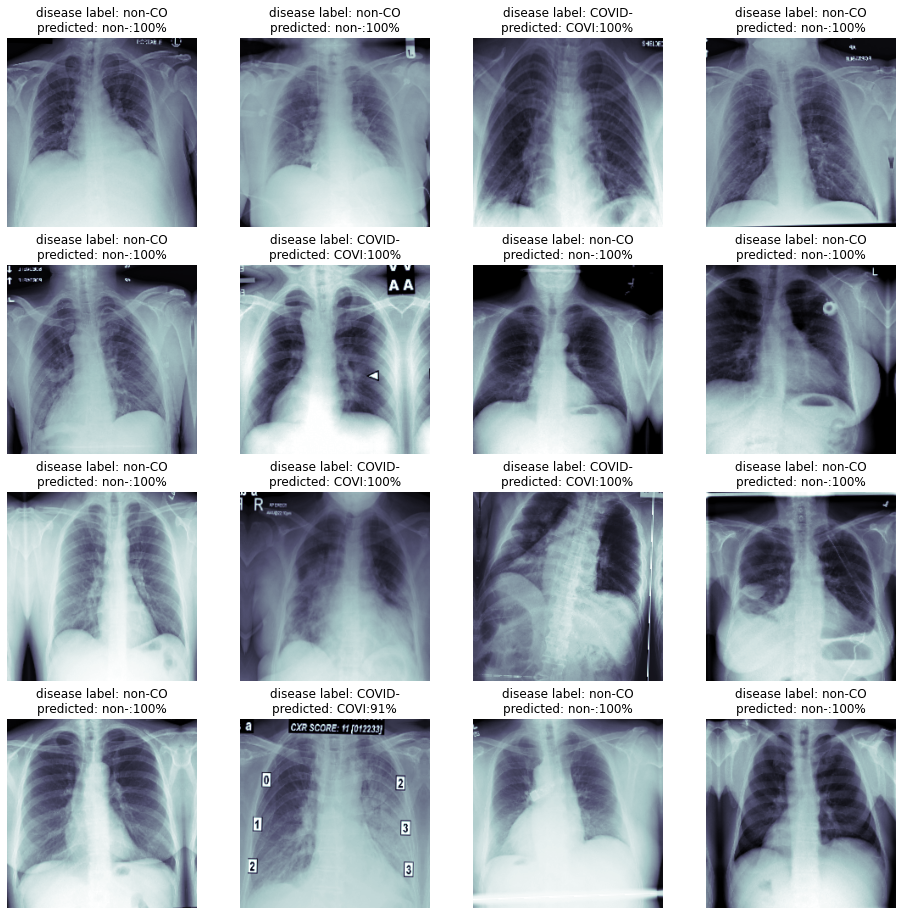

In [57]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

#### train COVID-Cardiomegaly - 11 layers

29089792/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_____________________________

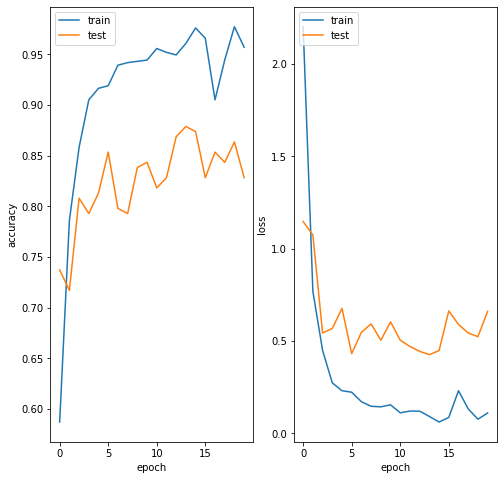

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 0.4970 - binary_accuracy: 0.8633 - auc: 0.9299
Epoch 00001: loss improved from inf to 0.49704, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_cardio/model_21_cardio.h5
13/13 [==============================] - 14s 1s/step - loss: 0.4970 - binary_accuracy: 0.8633 - auc: 0.9299 - val_loss: 3.0478 - val_binary_accuracy: 0.6111 - val_auc: 0.7042
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 0.1237 - binary_accuracy: 0.9620 - auc: 0.9927
Epoch 00002: loss improved from 0.49704 to 0.12372, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_cardio/model_21_cardio.h5
13/13 [==============================] - 13s 980ms/step - loss: 0.1237 - binary_accuracy: 0.9620 - auc: 0.9927 - val_loss: 2.7298 - val_binary_accuracy: 0.6414 - val_auc: 0.7217
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.0885 - binary_accuracy: 0.9

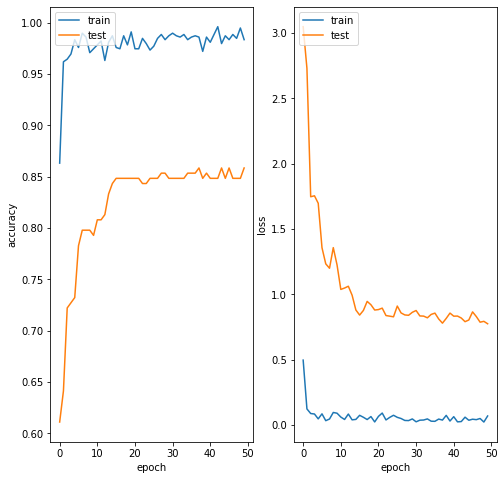

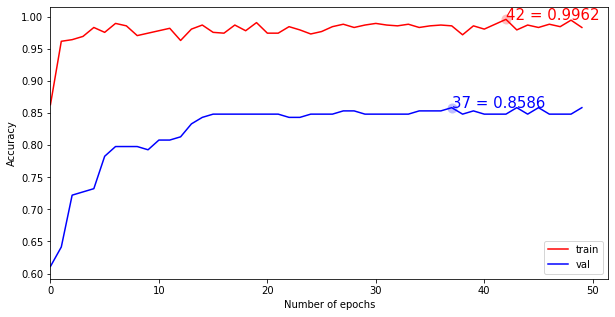

In [38]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_cardio/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_cardio/model_21_cardio.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-11]:
    layer.trainable=False
    
for layer in model.layers[-11:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_cardio/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_cardio/model_21_cardio.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [39]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_cardio/model_21_cardio.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

COVID-19: actual: 42.42%, predicted: 37.90%
Cardiomegaly: actual: 57.58%, predicted: 61.99%


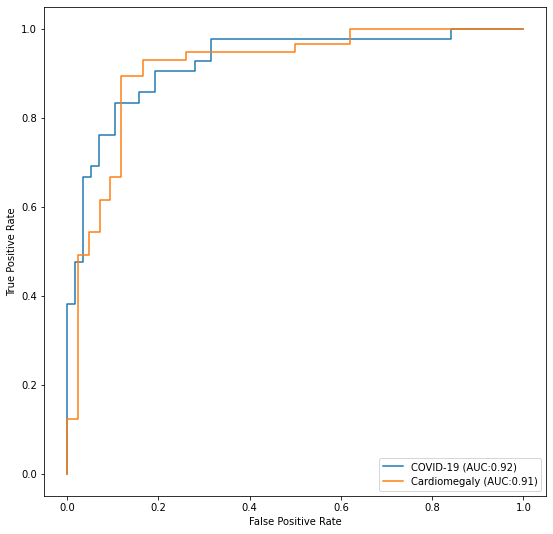

In [40]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

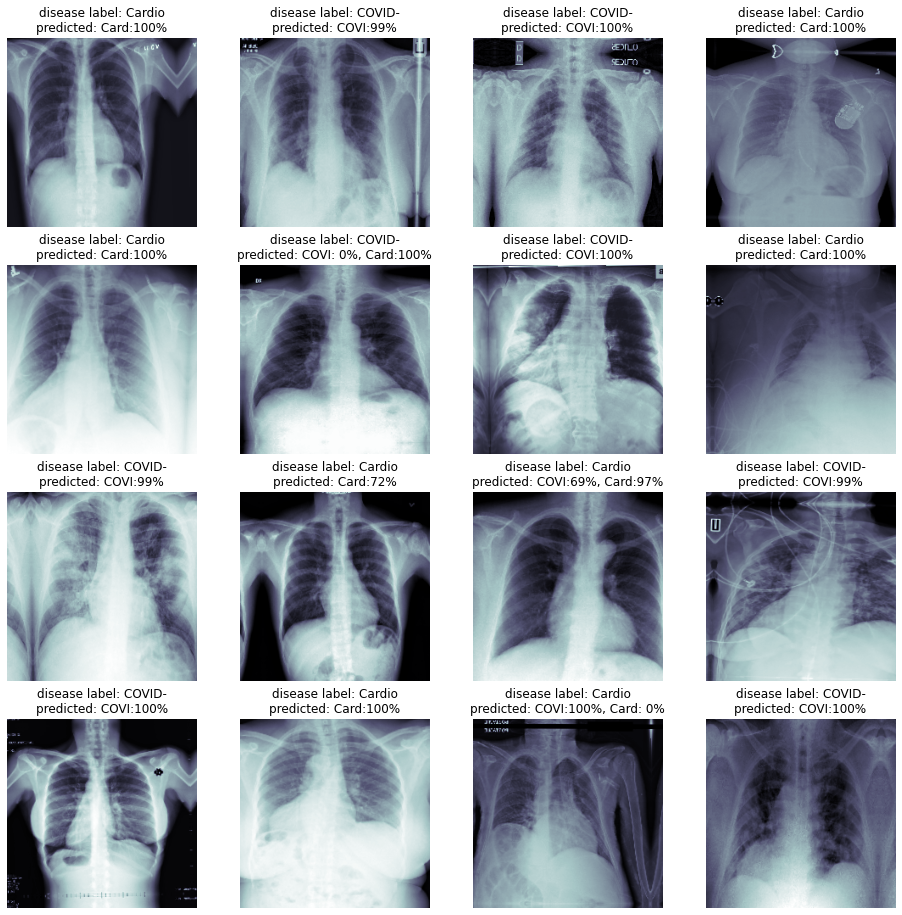

In [41]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

#### train COVID-Effusion - 11 layers

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

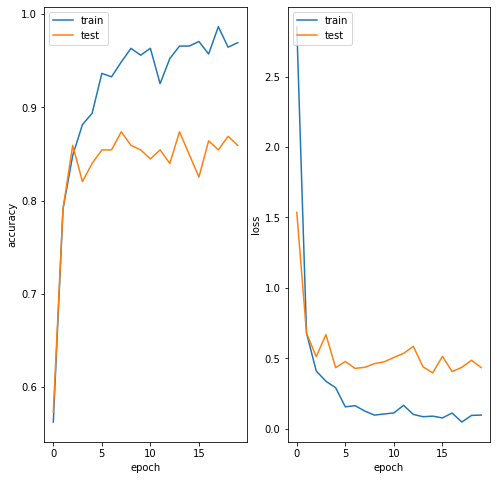

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 0.1849 - binary_accuracy: 0.9413 - auc: 0.9808
Epoch 00001: loss improved from inf to 0.18490, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_effu/model_21_effu.h5
13/13 [==============================] - 15s 1s/step - loss: 0.1849 - binary_accuracy: 0.9413 - auc: 0.9808 - val_loss: 0.6402 - val_binary_accuracy: 0.8495 - val_auc: 0.9131
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 0.0820 - binary_accuracy: 0.9731 - auc: 0.9950
Epoch 00002: loss improved from 0.18490 to 0.08197, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_effu/model_21_effu.h5
13/13 [==============================] - 13s 1s/step - loss: 0.0820 - binary_accuracy: 0.9731 - auc: 0.9950 - val_loss: 0.9177 - val_binary_accuracy: 0.8204 - val_auc: 0.8833
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.0287 - binary_accuracy: 0.9902 - auc: 

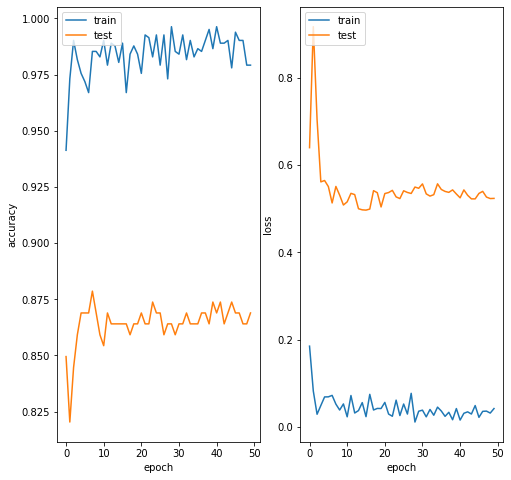

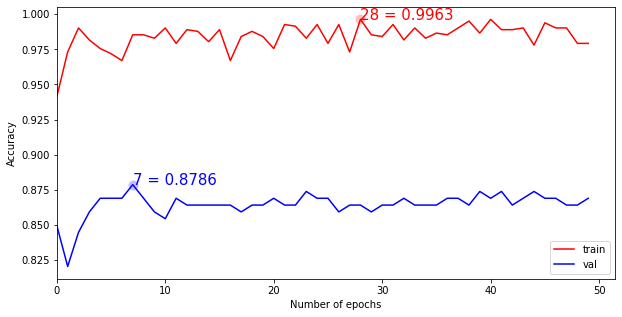

In [37]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_effu/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21_effu/model_21_effu.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-11]:
    layer.trainable=False
    
for layer in model.layers[-11:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_effu/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_effu/model_21_effu.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [38]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2_effu/model_21_effu.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

COVID-19: actual: 39.81%, predicted: 35.38%
Effusion: actual: 60.19%, predicted: 63.62%


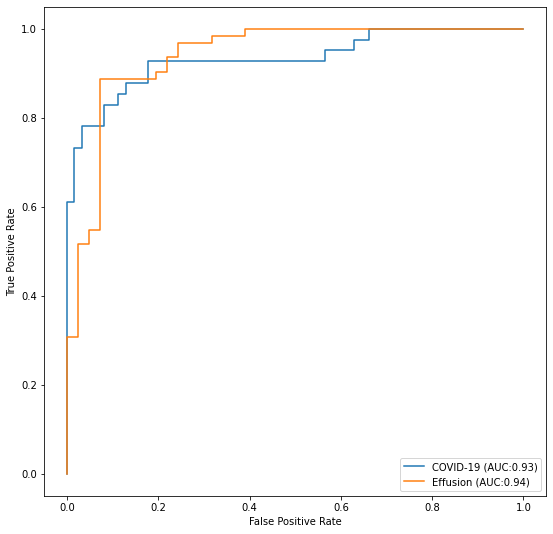

In [39]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

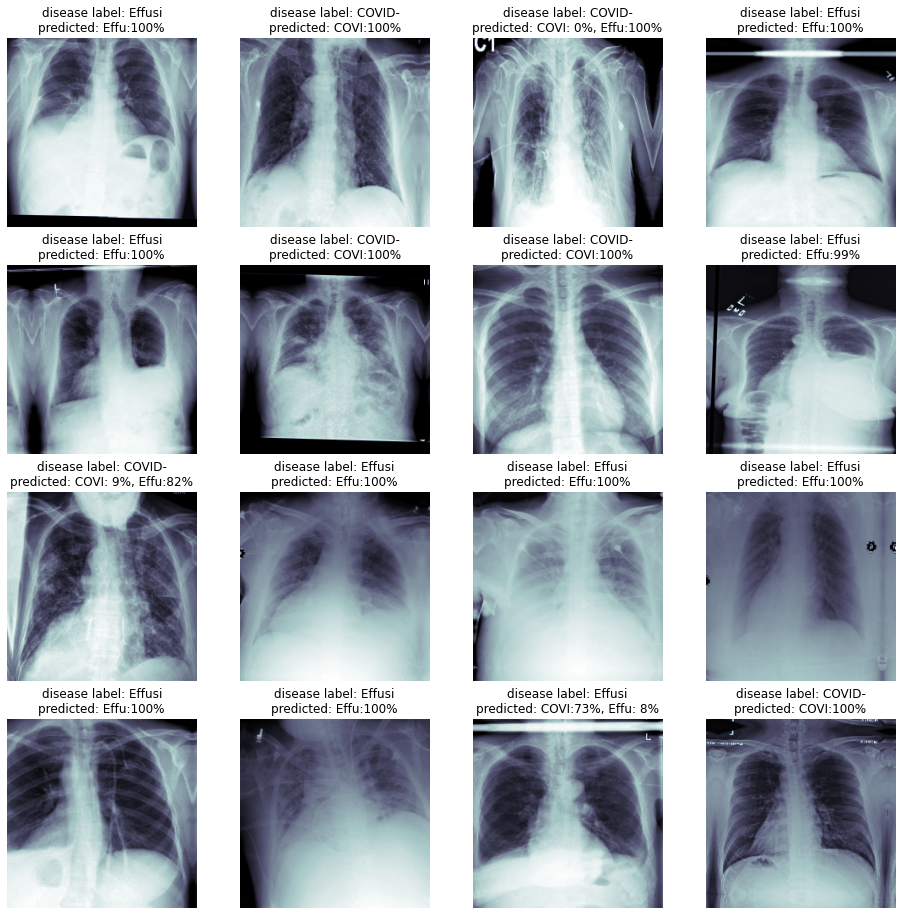

In [40]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

#### train No.1

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_2 (ZeroPadding2D (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_2[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

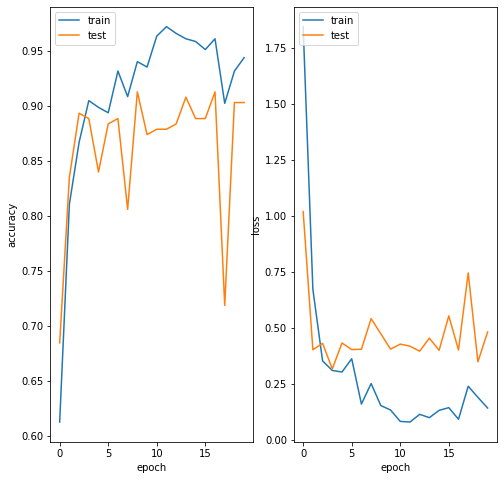

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 1.4491 - binary_accuracy: 0.7029 - auc: 0.7569
Epoch 00001: loss improved from inf to 1.44906, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5
13/13 [==============================] - 19s 1s/step - loss: 1.4491 - binary_accuracy: 0.7029 - auc: 0.7569 - val_loss: 1.1827 - val_binary_accuracy: 0.7427 - val_auc: 0.8519
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 0.6101 - binary_accuracy: 0.8178 - auc: 0.8861
Epoch 00002: loss improved from 1.44906 to 0.61012, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5
13/13 [==============================] - 15s 1s/step - loss: 0.6101 - binary_accuracy: 0.8178 - auc: 0.8861 - val_loss: 1.9160 - val_binary_accuracy: 0.6942 - val_auc: 0.7948
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.4915 - binary_accuracy: 0.8826 - auc: 0.9403
Epoch 00003: 

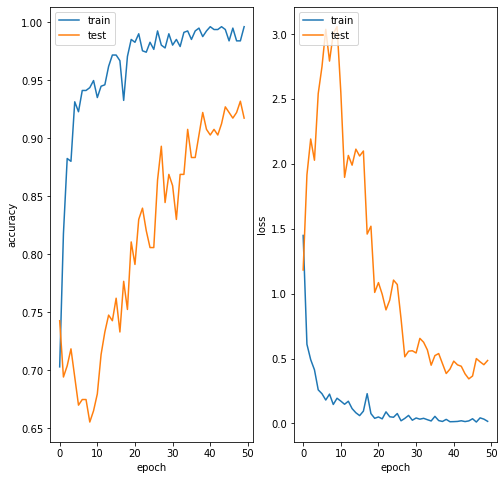

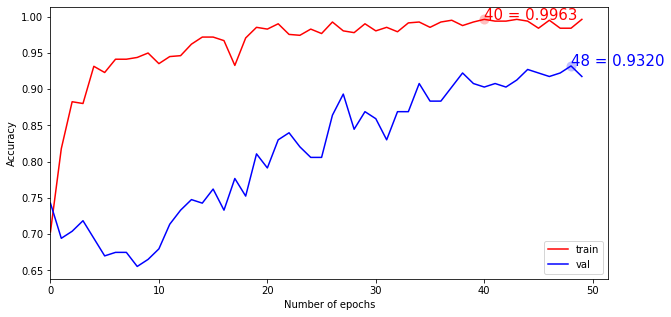

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18/model_18.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers:
   layer.trainable = True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5')


In [ ]:
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

COVID-19: actual: 39.81%, predicted: 29.74%
Normal: actual: 60.19%, predicted: 70.63%


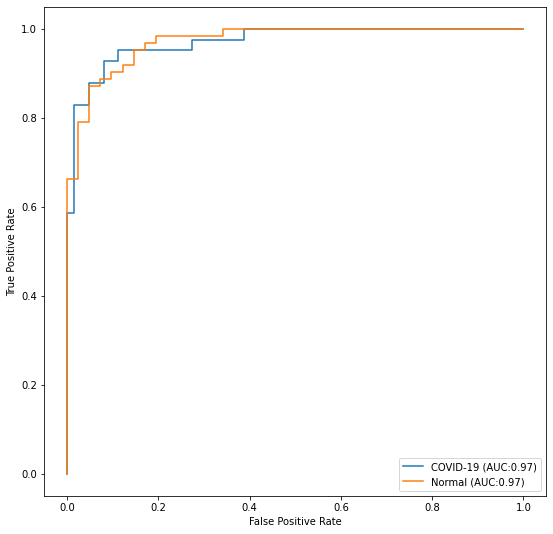

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred4)))

ROC auc score: 0.971


##### test for each disease

Found 16 validated image filenames belonging to 2 classes.


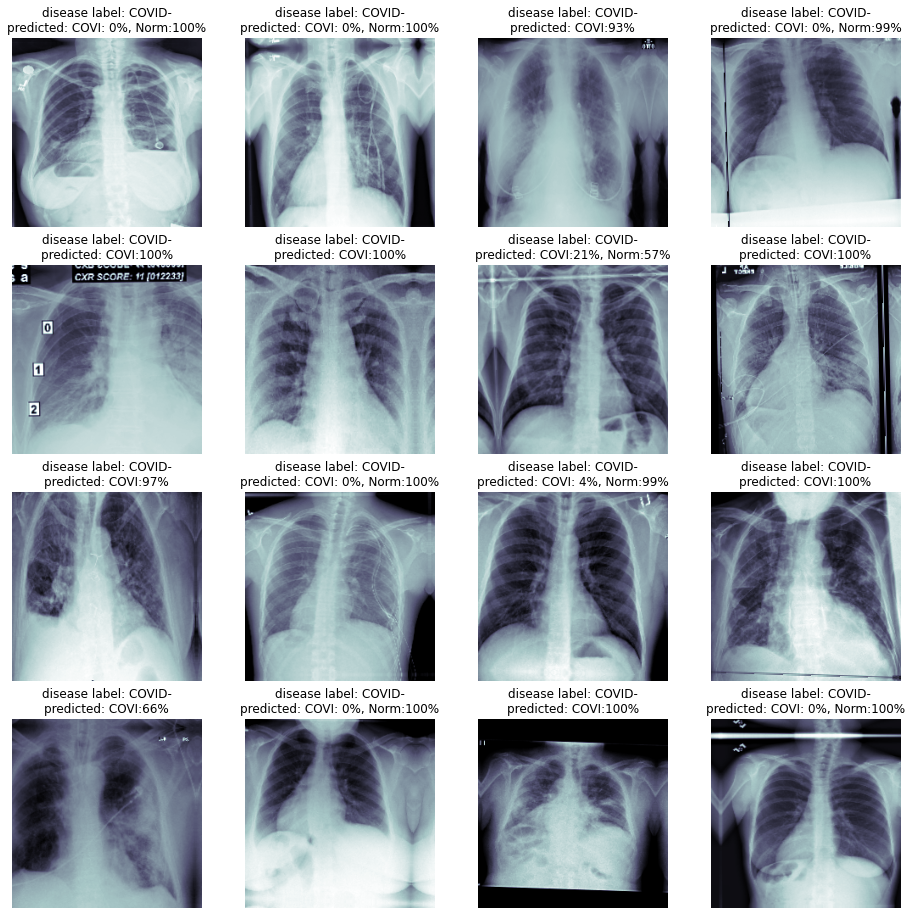

In [ ]:
# for COVID
valid_card_df = valid_df[valid_df.disease == "COVID-19"].sample(n=16, random_state=5)
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

Found 8 validated image filenames belonging to 2 classes.


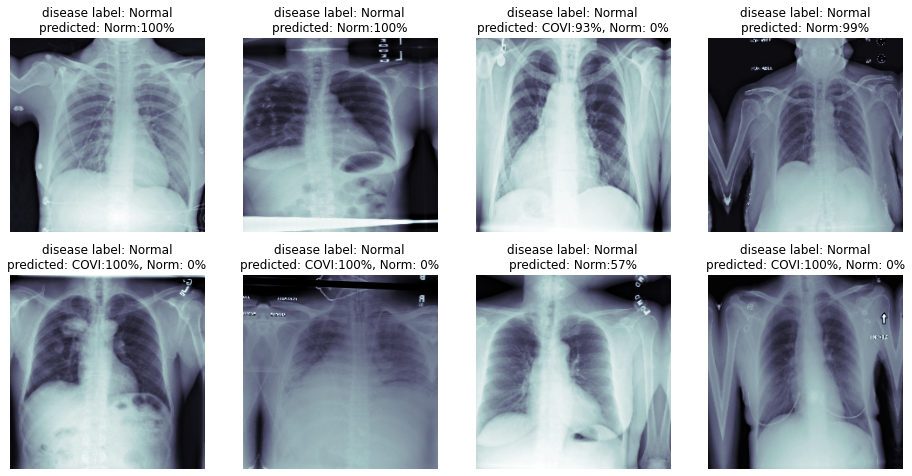

In [ ]:
# for Normal
valid_card_df = valid_df[valid_df.disease == "Normal"].sample(n=8, random_state=5)
test_X3, test_Y3 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y3, 1)<1)
fig, m_axs = plt.subplots(2, 4, figsize = (16, 8))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X3[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y3[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y3[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

#### train No.2 - 48 layers

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

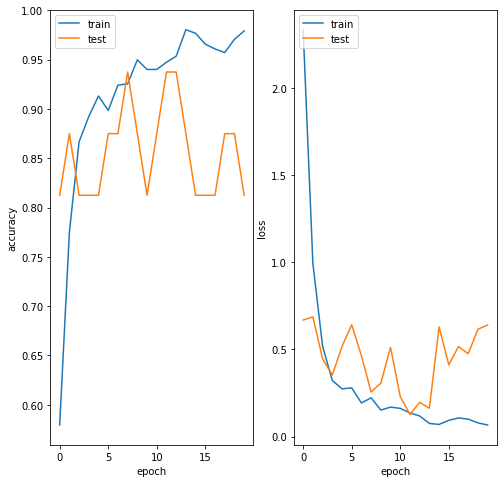

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 0.2864 - binary_accuracy: 0.9046 - auc: 0.9583
Epoch 00001: loss improved from inf to 0.28642, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_19p2/model_19.h5
13/13 [==============================] - 17s 1s/step - loss: 0.2864 - binary_accuracy: 0.9046 - auc: 0.9583 - val_loss: 0.0295 - val_binary_accuracy: 1.0000 - val_auc: 1.0000
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 0.1285 - binary_accuracy: 0.9560 - auc: 0.9929
Epoch 00002: loss improved from 0.28642 to 0.12846, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_19p2/model_19.h5
13/13 [==============================] - 15s 1s/step - loss: 0.1285 - binary_accuracy: 0.9560 - auc: 0.9929 - val_loss: 0.0476 - val_binary_accuracy: 0.9375 - val_auc: 1.0000
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.0920 - binary_accuracy: 0.9682 - auc: 0.9938
Epoch 00003: 

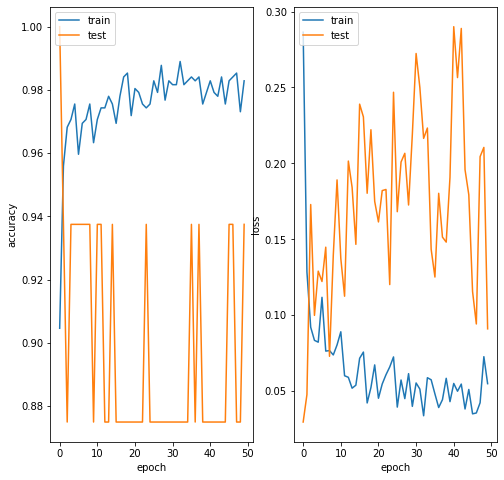

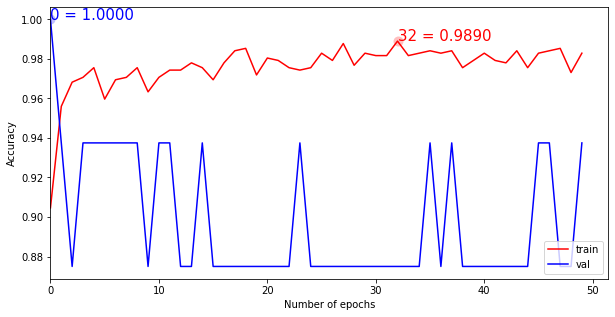

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_19/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_19/model_19.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-48]:
    layer.trainable=False
    
for layer in model.layers[-48:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_19p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_19p2/model_19.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_19p2/model_19.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

COVID-19: actual: 39.81%, predicted: 38.74%
Normal: actual: 60.19%, predicted: 60.05%


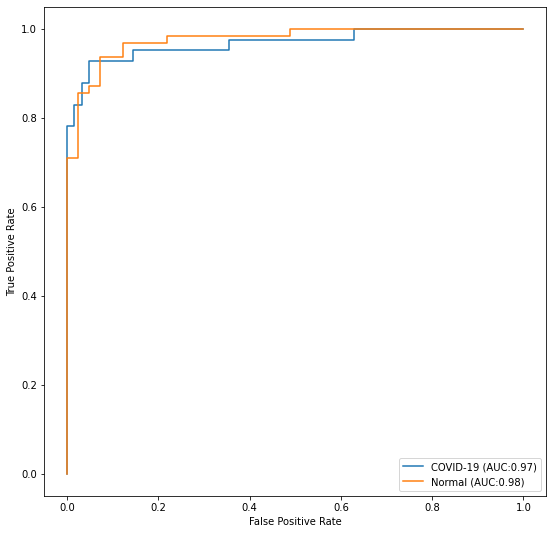

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred4)))

ROC auc score: 0.972


Found 16 validated image filenames belonging to 2 classes.


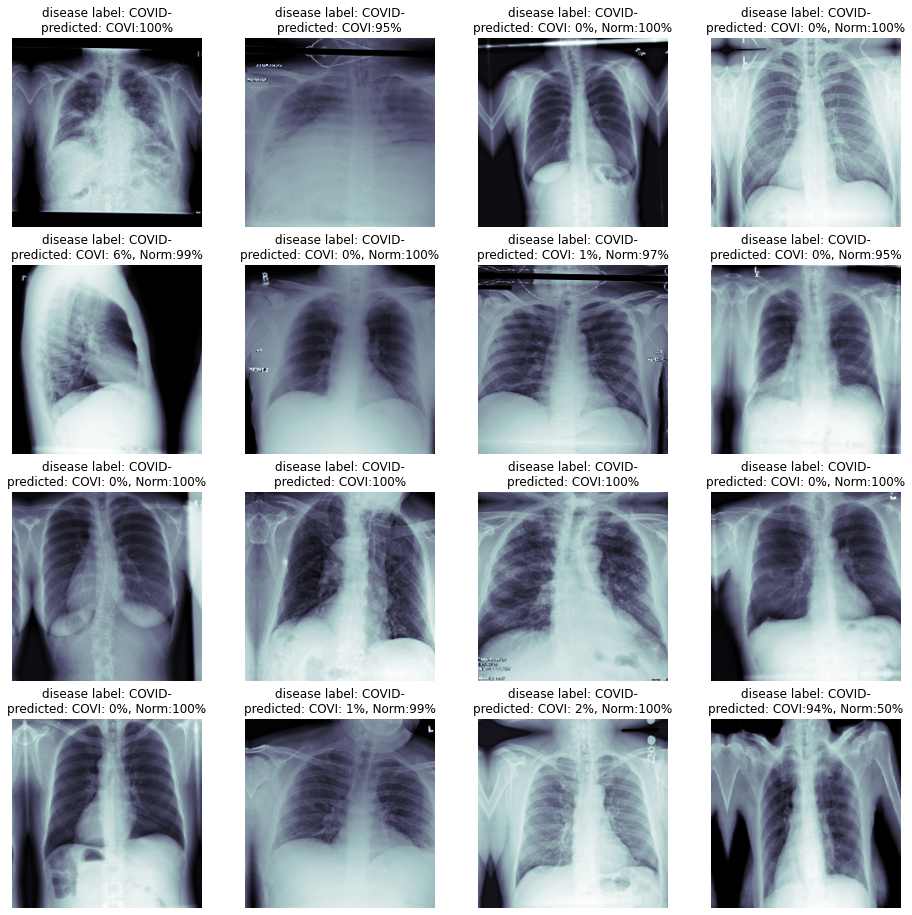

In [ ]:
# for COVID
valid_card_df = valid_df[valid_df.disease == "COVID-19"].sample(n=16, random_state=5)
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

Found 16 validated image filenames belonging to 2 classes.


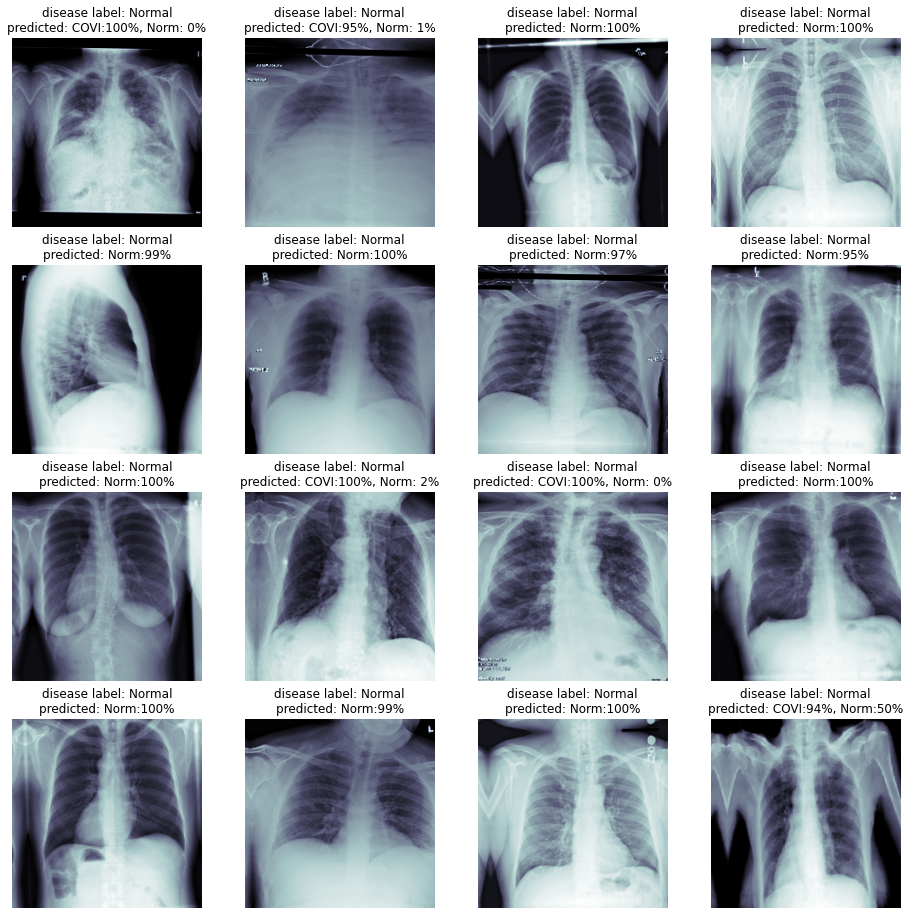

In [ ]:
# for COVID
valid_card_df = valid_df[valid_df.disease == "Normal"].sample(n=16, random_state=5)
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

### train No.2 - 8 layers

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_20/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_20/model_20.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-7]:
    layer.trainable=False
    
for layer in model.layers[-7:]:
    layer.trainable=True
print(model.layers[-7:])

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_20p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_20p2/model_20.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_8 (ZeroPadding2D (None, 230, 230, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_8[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

KeyboardInterrupt: ignored

In [ ]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_20p2/model_20.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

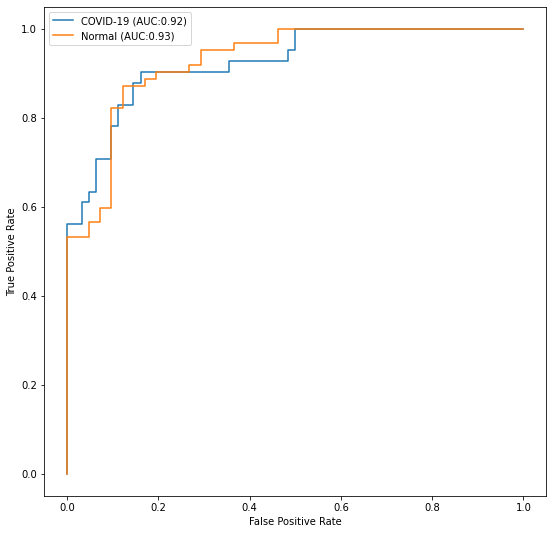

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred4)))

ROC auc score: 0.926


Found 16 validated image filenames belonging to 2 classes.


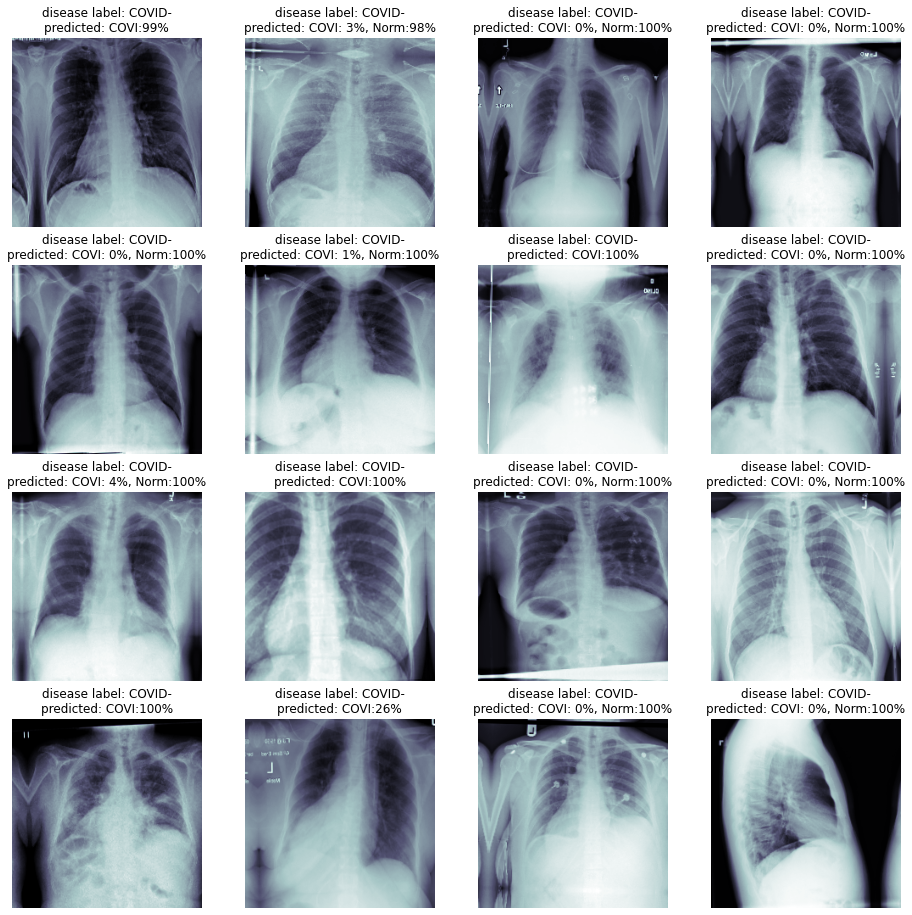

In [ ]:
# for COVID
valid_card_df = valid_df[valid_df.disease == "COVID-19"].sample(n=16, random_state=5)
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

Found 16 validated image filenames belonging to 2 classes.


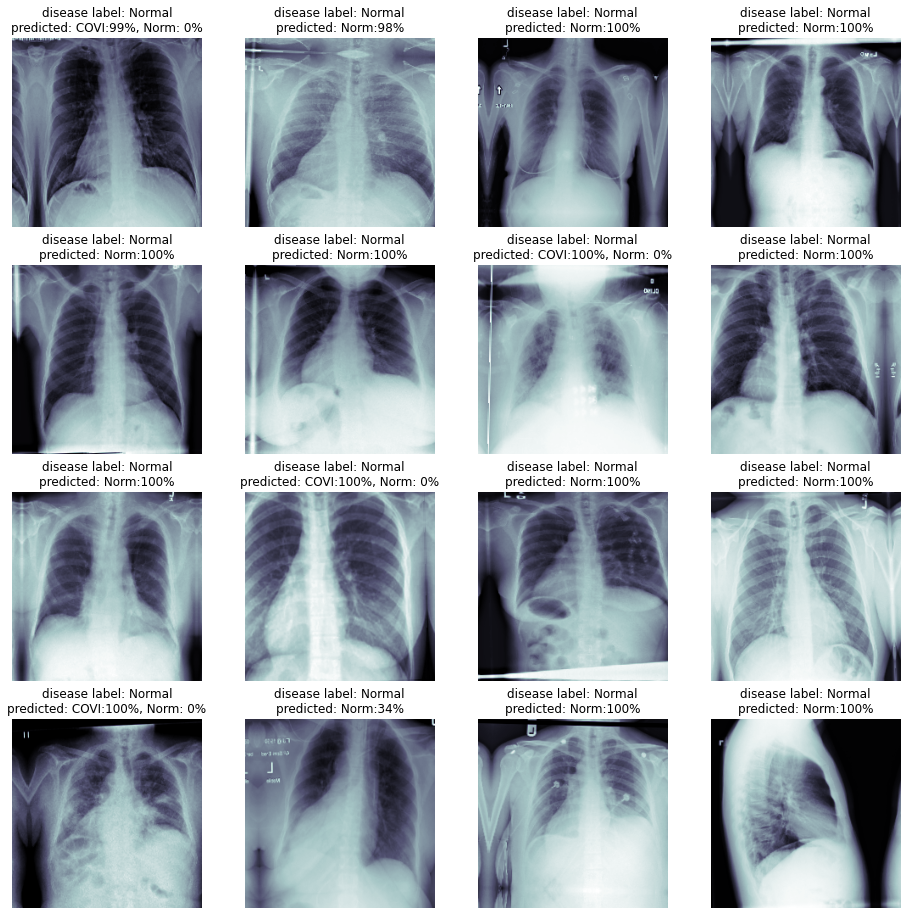

In [ ]:
# for COVID
valid_card_df = valid_df[valid_df.disease == "Normal"].sample(n=16, random_state=5)
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_card_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

In [ ]:
model.layers[-11:]

### train No.3 - 11 layers

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_10 (ZeroPadding2 (None, 230, 230, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_10[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

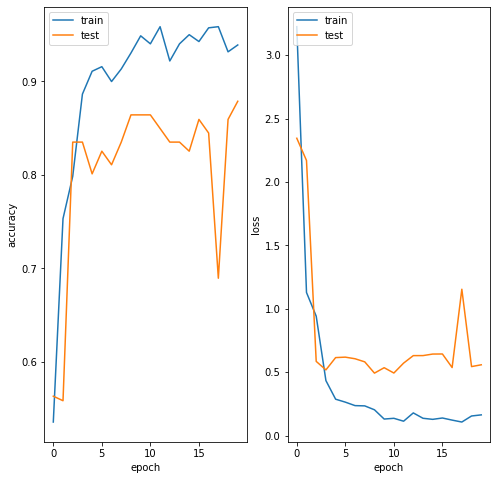

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 0.2348 - binary_accuracy: 0.9364 - auc: 0.9755
Epoch 00001: loss improved from inf to 0.23482, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2/model_21.h5
13/13 [==============================] - 17s 1s/step - loss: 0.2348 - binary_accuracy: 0.9364 - auc: 0.9755 - val_loss: 0.8088 - val_binary_accuracy: 0.8301 - val_auc: 0.8940
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 0.0624 - binary_accuracy: 0.9792 - auc: 0.9970
Epoch 00002: loss improved from 0.23482 to 0.06236, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2/model_21.h5
13/13 [==============================] - 15s 1s/step - loss: 0.0624 - binary_accuracy: 0.9792 - auc: 0.9970 - val_loss: 0.7783 - val_binary_accuracy: 0.8301 - val_auc: 0.9001
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.0697 - binary_accuracy: 0.9719 - auc: 0.9964
Epoch 00003: 

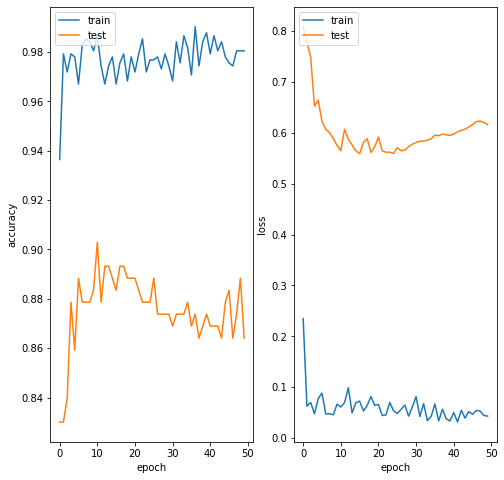

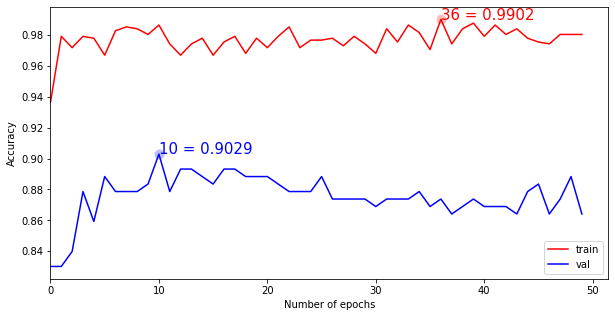

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21/model_21.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

for layer in model.layers[:-11]:
    layer.trainable=False
    
for layer in model.layers[-11:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2/model_21.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [1]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_21p2/model_21.h5')
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

NameError: ignored

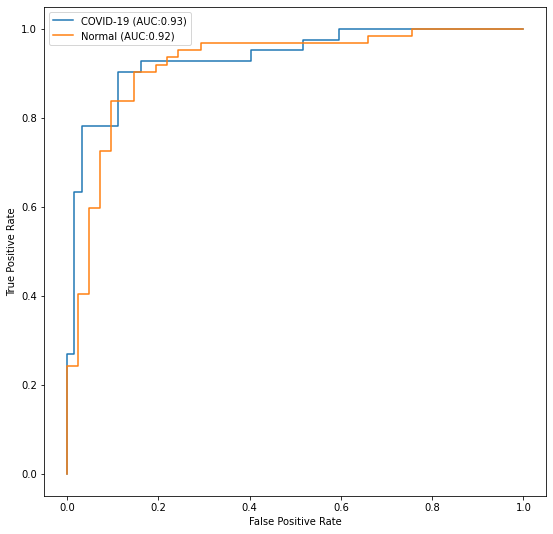

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

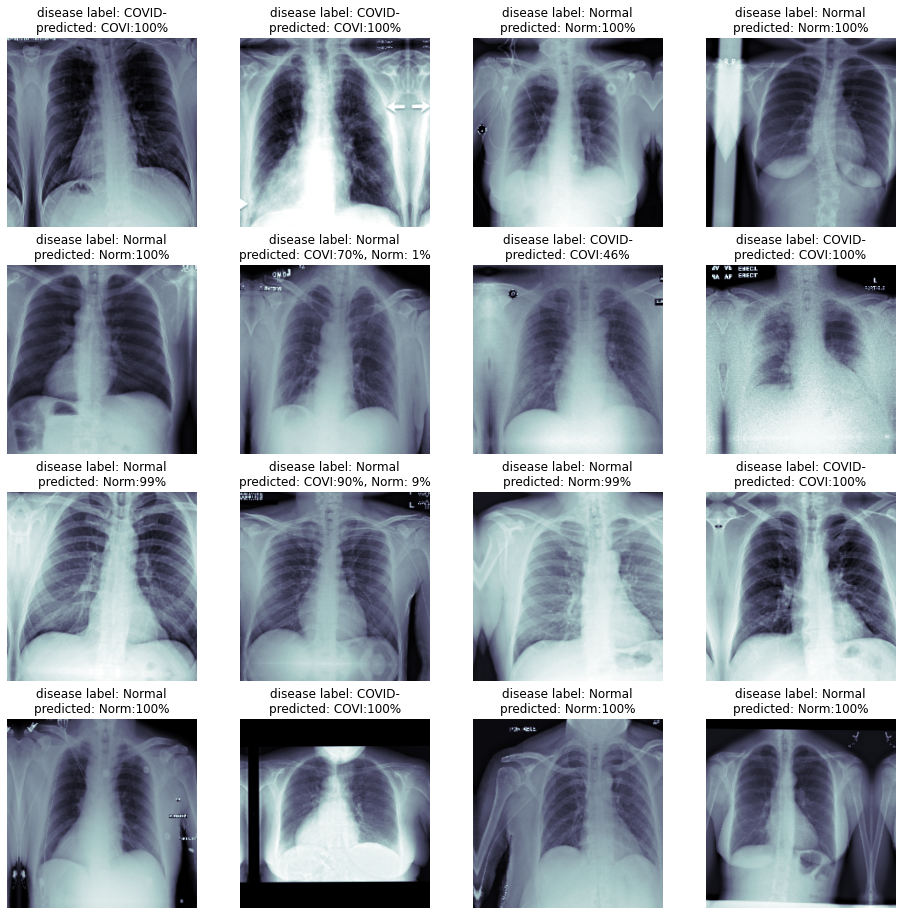

In [ ]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred4)))

ROC auc score: 0.927


      disease                                               path    labels
107  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
135  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
111  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
95   COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
8    COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
441  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
140  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
436  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
291  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
386  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
132  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
501  COVID-19  /content/gdrive/My Drive/w210_capstone/balance...  COVID-19
41   COVID-19  /content/g

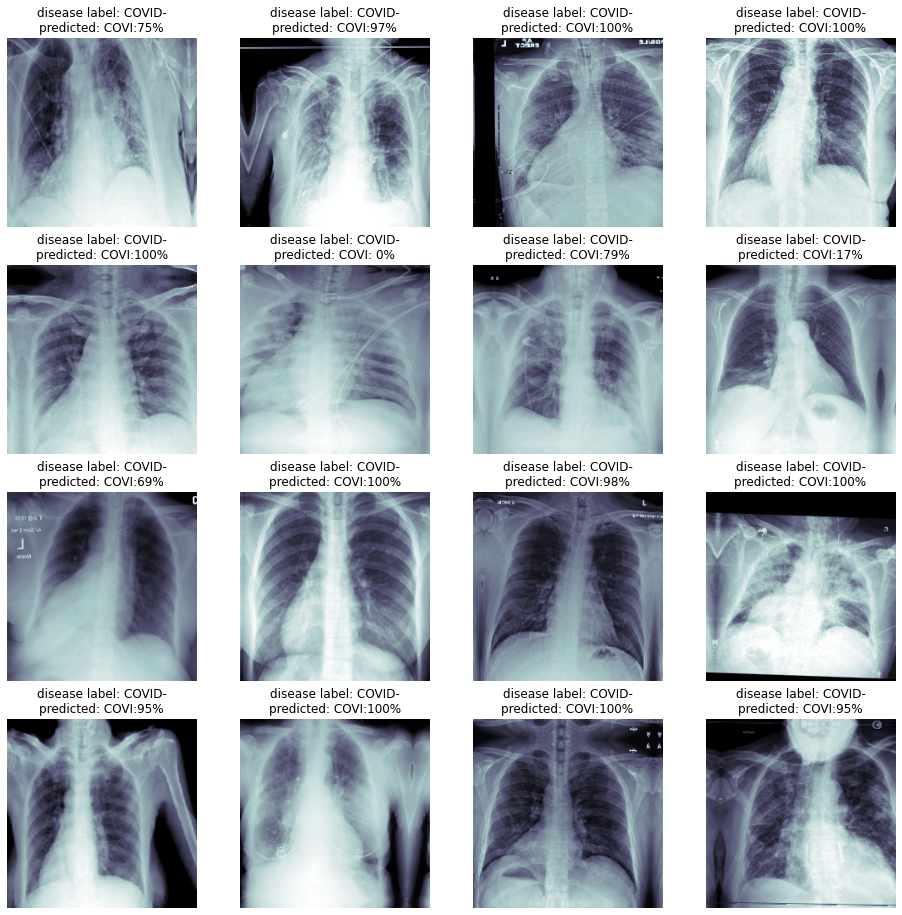

In [ ]:
# for COVID
valid_df1 = valid_df[valid_df.disease == "COVID-19"].sample(n=16, random_state=5)
print(valid_df1.head(16))
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_df1,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=['COVID-19'],
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X2)

sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X2[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

    disease                                               path  labels
396  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
182  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
177  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
152  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
511  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
256  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
150  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
299  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
353  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
416  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
440  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
467  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
199  Normal  /content/gdrive/My Drive/w210_capstone/balance...  Normal
510  N

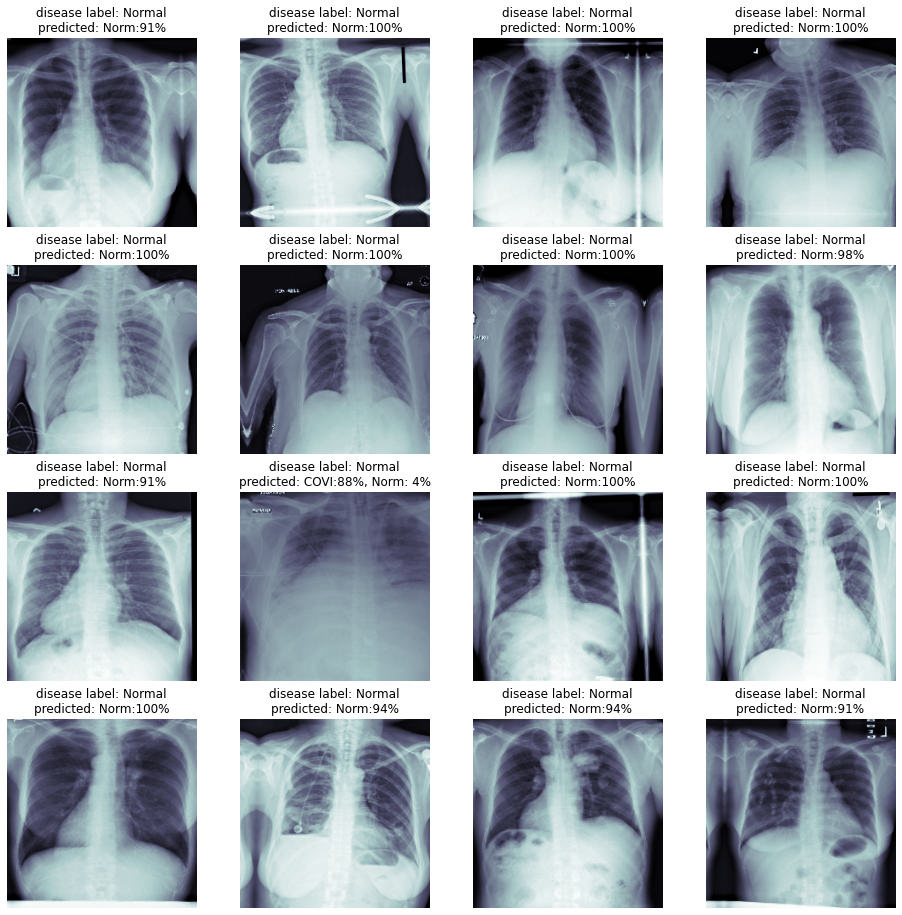

In [ ]:
# for COVID
valid_df2 = valid_df[valid_df.disease == "Normal"].sample(n=16, random_state=5)
print(valid_df2.head(16))

test_X3, test_Y3 = next(core_idg.flow_from_dataframe(dataframe=valid_df2,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X3)

sickest_idx = np.argsort(np.sum(test_Y3, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X3[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y3[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y3[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')